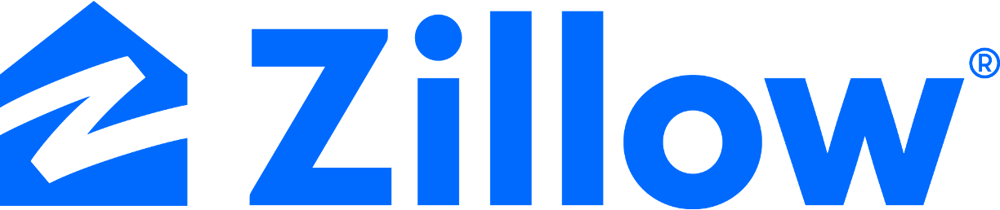

# Zillow Research


- Olenka Beasga
- ECO 590
- Spring 2023


## Motivation
-  According to the Congressional Research Service, by studying the trends in the housing market, policymakers and economists can make informed decisions that can influence the economy. Housing is often one of the most significant investments that individuals make in their lifetimes. This research can help individuals make informed decisions about buying, selling, or renting a property, as well as identifying emerging trends and opportunities for investment. In addition, the housing market is subject to various market forces, including supply and demand, interest rates, and government policies. By studying the housing market, analysts and researchers can gain insight into market dynamics, identify trends, and make predictions about future market conditions.

## Research Question
- How does the type of heating affect housing price in New York State for residential properties?

## Data
- The Zillow data is used from Bridge Interactive.
- The Bridge platform is comprised of two components: 
1. The platform dashboard: for managing data access, API tokens and documentation 
2. The data transports: RESO Web API, RETS and Bridge Web API.
- The Bridge platform allows you to request data access from any of their customer data providers. All datasets available through the platform require approval from the data provider. 
- The Bridge API platform allows users to request access to various datasets made available by Zillow Group. They have Public Records (United States), Zillow Zestimates and Zillow Group Econ data. Once access has been granted (token given), developers are able to integrate with our native API to get approved data.

website: https://bridgedataoutput.com/docs/explorer/public-data

## Cleaning Data from API

In [1]:
# I imported requests
import requests
import pandas as pd

In [2]:
# I defined my token as a string, also for me to refer back to the token if needed, instead of using the long code.
token = 'dbbcd25fd075611d4a53183948eb6cd6'

In [3]:
# each property information is in a dictionary. And Each round (page) we scrape, we recieve 200 dictionaries. 
# here i created an empty list called, "all_records" to store all property dictionaries. 
all_records = []
# i started with this url,  this will grab the first 200 properties, this is with specificaltion from the end of the url "$top=200".
# $top is a number, its purpose is that it Limits the size of the result set. Default is 10, maximum is 200.
url = "https://api.bridgedataoutput.com/api/v2/OData/test/Property?access_token=6baca547742c6f96a6ff71b138424f21&$top=200"

# print the url
print(url)
# i made a GET request to the URL and I am defining the request to be called response.
# the response is in json format, accoridng to my api it already gives it in json format
response = requests.get(url)
# print the outcome of response, in other words, the output of response is the status code
response

# outcome is 200!!! YAY

https://api.bridgedataoutput.com/api/v2/OData/test/Property?access_token=6baca547742c6f96a6ff71b138424f21&$top=200


<Response [200]>

In [4]:
# using .json() method to transform response into python format, called "data"
data = response.json()
# the first 200 dictionary is stored under the key "value" in dictionary "data". 
#Add all 200 records in the list created "all_records"
#The plus-equals operator += provides a convenient way to add a value to an existing 
#variable and assign the new value back to the same variable.
all_records += data['value']
# outcome
all_records


[{'@odata.context': 'https://api.bridgedataoutput.com/api/v2/OData/test/$metadata#Property',
  '@odata.id': "https://api.bridgedataoutput.com/api/v2/OData/test/Property('P_5dba1fb94aa4055b9f29691f')",
  'StreetDirPrefix': None,
  'DistanceToStreetComments': None,
  'PublicSurveyRange': None,
  'LeaseAssignableYN': None,
  'GreenWaterConservation': [],
  'NumberOfUnitsMoMo': None,
  'LivingAreaUnits': 'SquareFeet',
  'CoListAgentCellPhone': None,
  'SeatingCapacity': None,
  'TaxLegalDescription': 'Quis enim dolores voluptatibus aperiam repellat. Dolores vel at ut beatae vel facilis. Eum similique enim quas et quae. Dicta debitis est quasi accusamus.\n \r\tIn aut dicta esse. Ratione est est est et. Architecto nulla doloremque similique est. Mollitia odit et ea deleniti.',
  'LockBoxLocation': 'Nesciunt harum magnam molestiae. Quia et eum deserunt quod. Quo ipsam placeat qui sed omnis qui dicta laborum. Aut et cum officia expedita autem quibusdam.',
  'BuyerAgentDesignation': [],
  'Year

In [5]:
#import pprint package
import pprint

pp = pprint.PrettyPrinter(indent=1)
pp.pprint(all_records)

[{'@odata.context': 'https://api.bridgedataoutput.com/api/v2/OData/test/$metadata#Property',
  '@odata.id': "https://api.bridgedataoutput.com/api/v2/OData/test/Property('P_5dba1fb94aa4055b9f29691f')",
  'AboveGradeFinishedArea': 2517,
  'AboveGradeFinishedAreaSource': 'Assessor',
  'AboveGradeFinishedAreaUnits': 'Square Meteres',
  'AccessCode': 'z75m',
  'AccessibilityFeatures': [],
  'AdditionalParcelsDescription': None,
  'AdditionalParcelsYN': False,
  'AnchorsCoTenants': 'Parisian-Hermann,Waelchi, Gislason and '
                      'Halvorson,Altenwerth-Zieme,Krajcik-Beatty,Harber '
                      'LLC,Bailey and Sons',
  'Appliances': ['Dishwasher', 'Disposal', 'Oven', 'Microwave'],
  'ApprovalStatus': None,
  'ArchitecturalStyle': ['et',
                         'quos',
                         'velit',
                         'consequatur',
                         'enim',
                         'sed',
                         'sed',
                         'et',
 

  'CommonInterest': None,
  'CommonWalls': ['No One Above'],
  'CommunityFeatures': ['quod', 'id', 'exercitationem'],
  'Concessions': None,
  'ConcessionsAmount': None,
  'ConcessionsComments': None,
  'ConstructionMaterials': ['Wood'],
  'ContinentRegion': None,
  'Contingency': 'Sit beatae est asperiores voluptas quae ut voluptatem. '
                 'Consequatur corrupti sunt ut dolorem ab. Ipsum excepturi '
                 'ipsam a sapiente. Dignissimos sed quis reprehenderit '
                 'incidunt ex.',
  'ContingentDate': '2018-11-18',
  'ContractStatusChangeDate': '2019-10-29',
  'Cooling': ['Evaporative Cooler', 'Ceiling Fan', 'Central Air'],
  'CoolingYN': False,
  'Coordinates': [-117.745157, 33.411474],
  'CopyrightNotice': 'Dolorum sit odit libero magni magni corporis consequatur '
                     'ad. Consequatur molestias enim aut accusantium dicta ut '
                     'et. Dignissimos quo exercitationem dolor veritatis. Quo '
                     'quam

 {'@odata.context': 'https://api.bridgedataoutput.com/api/v2/OData/test/$metadata#Property',
  '@odata.id': "https://api.bridgedataoutput.com/api/v2/OData/test/Property('P_5dba1fba4aa4055b9f296ac1')",
  'AboveGradeFinishedArea': 7952,
  'AboveGradeFinishedAreaSource': 'Estimate',
  'AboveGradeFinishedAreaUnits': 'Square Feet',
  'AccessCode': 'npqm',
  'AccessibilityFeatures': ['Ramp'],
  'AdditionalParcelsDescription': None,
  'AdditionalParcelsYN': False,
  'AnchorsCoTenants': 'Veum, Runolfsdottir and Grant,Hintz, Erdman and '
                      'Haag,Schmitt LLC',
  'Appliances': ['Dishwasher', 'Disposal'],
  'ApprovalStatus': None,
  'ArchitecturalStyle': ['dolores',
                         'ut',
                         'eos',
                         'ex',
                         'illo',
                         'dolore',
                         'totam',
                         'aut'],
  'AssociationAmenities': [],
  'AssociationFee': 432,
  'AssociationFee2': 369,
  'Asso

  'BuildingAreaTotal': 3788091,
  'BuildingAreaUnits': 'Acres',
  'BuildingFeatures': ['Gym',
                       'Cafeteria',
                       'Patio/Rooftop Deck',
                       'Lounge',
                       'Elevator'],
  'BuildingName': 'Joan Mueller Plc',
  'BusinessName': 'Deckow, Donnelly and Sauer',
  'BusinessType': ['Farm'],
  'BuyerAgencyCompensation': None,
  'BuyerAgencyCompensationType': None,
  'BuyerAgentAOR': None,
  'BuyerAgentCellPhone': None,
  'BuyerAgentDesignation': [],
  'BuyerAgentDirectPhone': None,
  'BuyerAgentEmail': None,
  'BuyerAgentFax': None,
  'BuyerAgentFirstName': None,
  'BuyerAgentFullName': None,
  'BuyerAgentHomePhone': None,
  'BuyerAgentKey': None,
  'BuyerAgentKeyNumeric': None,
  'BuyerAgentLastName': None,
  'BuyerAgentMiddleName': None,
  'BuyerAgentMlsId': None,
  'BuyerAgentMobilePhone': None,
  'BuyerAgentNamePrefix': None,
  'BuyerAgentNameSuffix': None,
  'BuyerAgentOfficePhone': None,
  'BuyerAgentOfficePhoneExt'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [6]:
#the length function, we are only grabbing the listings from the first "page", we need a loop, which here there are 200 listings.
len(all_records) 

200

In [7]:
# I created a while loop to get all 10k records. The while loop does not stop until there is nothing under the key "@odata.nextLink"
while data.get('@odata.nextLink') != None:
    # for each round of loop, using the url stored under the key of "data": @odata.nextLink will be looping and repeating to get all the 10006 listings.
    url = data['@odata.nextLink']
    # repeat the process by creating a new get request each time, defined response
    response = requests.get(url)
    #defined it "data", repeating the process using the json method and converting it into the python format, since the api is already in json format
    data = response.json()
    # add all the listings to the previous variable "all_records"
    all_records += data['value']
    # at the end of each round of loop, all_records should have 200 more property dictionaries
    

In [8]:
len(all_records) #checking to see if there are over 200 listings, yes there is 10006

10006

In [9]:
# named the variable " field"
# listed the specific varibales that I need for this research from the API
fields = ['PropertyType', 'BedroomsTotal', 'City','DaysOnMarket','Flooring','Heating','HighSchoolDistrict','Levels','LotSizeSquareFeet','OriginalListPrice','RoomsTotal','Stories','UnparsedAddress','YearBuilt','PostalCode','PoolPrivateYN','CityRegion', 'Latitude','GarageSpaces','AttachedGarageYN','TaxAnnualAmount']
# goal: have a list that has 10k records, each a dictionary, with only 3 keys: 'StreetDirPrefix', 'DistanceToStreetComments', 'PublicSurveyRange'
all_records_simplified = []

# create an empty dictionary "simplified",  to store the 3 fields for each property
for prop in all_records:
    simplified = {}
    for key in fields:
        simplified[key] = prop[key]
    all_records_simplified.append(simplified)

all_records_simplified[0]

{'PropertyType': 'Residential',
 'BedroomsTotal': 2,
 'City': 'Emmyburgh',
 'DaysOnMarket': 218,
 'Flooring': ['Hardwood', 'Laminate', 'Vinyl', 'Tiles', 'Cork', 'Rugs'],
 'Heating': ['Electric', 'Forced Air'],
 'HighSchoolDistrict': 'Maine',
 'Levels': ['One Level', 'Two Level'],
 'LotSizeSquareFeet': 1769,
 'OriginalListPrice': 230052,
 'RoomsTotal': 23,
 'Stories': 2,
 'UnparsedAddress': None,
 'YearBuilt': 1942,
 'PostalCode': '72018',
 'PoolPrivateYN': False,
 'CityRegion': 'Larkinview',
 'Latitude': 33.588356,
 'GarageSpaces': 4,
 'AttachedGarageYN': False,
 'TaxAnnualAmount': 446054}

In [10]:
df = pd.DataFrame(all_records_simplified)
df
# created a dataframe using the data from "all_records_simplified" !!!
# printed the outcome/ the data frame

,PropertyType,BedroomsTotal,City,DaysOnMarket,Flooring,Heating,HighSchoolDistrict,Levels,LotSizeSquareFeet,OriginalListPrice,...,Stories,UnparsedAddress,YearBuilt,PostalCode,PoolPrivateYN,CityRegion,Latitude,GarageSpaces,AttachedGarageYN,TaxAnnualAmount
0,Residential,2,Emmyburgh,218,"[Hardwood, Laminate, Vinyl, Tiles, Cork, Rugs]","[Electric, Forced Air]",Maine,"[One Level, Two Level]",1769,230052,...,2,None,1942,72018,False,Larkinview,33.588356,4,False,446054
1,Residential,3,East Weldonhaven,335,"[Hardwood, Laminate, Vinyl, Tiles, Cork, Rugs]","[Wood, Forced Air, Electric]",New Jersey,"[One Level, Two Level]",848,868265,...,2,"#629 106 Hamill Courts Row, East Weldonhaven, ...",1991,80756-9169,True,South Nealland,34.298799,3,True,715117
2,Residential,2,Lorenzside,31,"[Hardwood, Laminate, Vinyl, Tiles, Cork, Rugs]","[Heat Pump, Wood]",West Virginia,[One Level],1232,875661,...,1,"#839 268 Deckow Circle Parkway, Lorenzside, De...",1978,23623,False,Skyefort,33.487027,3,True,960036
3,Residential,2,Martineton,268,[Hardwood],"[Boiler, Electric, Heat Pump]",Wyoming,[One Level],683,513202,...,1,None,1991,70479,True,West Christelle,34.180539,4,False,797073
4,Business,3,Aniyahville,85,"[Hardwood, Laminate]","[Boiler, Forced Air, Wood]",Tennessee,"[One Level, Two Level, Split Level]",768,312752,...,2,None,1982,95314-5550,True,Lake Gretchenland,34.083360,1,False,775961
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10001,Business,1,Phoenix,108,[Hardwood],[Heat Pump],Kansas,[One Level],592,660923,...,1,"#314 331 Jaskolski Plains Greens, Phoenix, AZ ...",1990,28370,False,Rohanhaven,33.520289,3,False,619136
10002,Residential,1,Phoenix,200,"[Hardwood, Laminate, Vinyl, Tiles, Cork]","[Heat Pump, Electric]",Illinois,"[One Level, Two Level, Split Level]",828,506472,...,1,"#902 94 Margot Courts Gardens, Phoenix, AZ 38439",1964,38439,False,South Mauricio,33.342468,1,False,477224
10003,Residential,4,Phoenix,247,"[Hardwood, Laminate, Vinyl, Tiles, Cork, Rugs]","[Electric, Forced Air, Wood]",Florida,"[One Level, Two Level, Split Level, Three or M...",598,291945,...,1,"#886 310 DuBuque Oval Tunnel, Phoenix, AZ 81494",1969,81494,False,West Thurmanville,33.445513,1,False,318441
10004,Business,1,Phoenix,16,[Hardwood],"[Wood, Forced Air, Electric]",Ohio,"[One Level, Two Level, Split Level, Three or M...",1762,773651,...,1,"#372 225 Gertrude Forge Row, Phoenix, AZ 34917...",1994,34917-0739,False,Lake Justine,33.518694,1,False,211693


In [11]:
df['years old'] =  2023 - df['YearBuilt']
# Here is where i created a new variable that I thought would be useful for me, I created a variable called "yeard old", meaning how old the property is
# so, i refrenced the df and named the new variable that will be generated as "years old" and did a math problem, i did 2023 - the variable from the data set "YearBuilt"


In [12]:
df
# to show the full new dataframe with my new variable " years old"

,PropertyType,BedroomsTotal,City,DaysOnMarket,Flooring,Heating,HighSchoolDistrict,Levels,LotSizeSquareFeet,OriginalListPrice,...,UnparsedAddress,YearBuilt,PostalCode,PoolPrivateYN,CityRegion,Latitude,GarageSpaces,AttachedGarageYN,TaxAnnualAmount,years old
0,Residential,2,Emmyburgh,218,"[Hardwood, Laminate, Vinyl, Tiles, Cork, Rugs]","[Electric, Forced Air]",Maine,"[One Level, Two Level]",1769,230052,...,None,1942,72018,False,Larkinview,33.588356,4,False,446054,81
1,Residential,3,East Weldonhaven,335,"[Hardwood, Laminate, Vinyl, Tiles, Cork, Rugs]","[Wood, Forced Air, Electric]",New Jersey,"[One Level, Two Level]",848,868265,...,"#629 106 Hamill Courts Row, East Weldonhaven, ...",1991,80756-9169,True,South Nealland,34.298799,3,True,715117,32
2,Residential,2,Lorenzside,31,"[Hardwood, Laminate, Vinyl, Tiles, Cork, Rugs]","[Heat Pump, Wood]",West Virginia,[One Level],1232,875661,...,"#839 268 Deckow Circle Parkway, Lorenzside, De...",1978,23623,False,Skyefort,33.487027,3,True,960036,45
3,Residential,2,Martineton,268,[Hardwood],"[Boiler, Electric, Heat Pump]",Wyoming,[One Level],683,513202,...,None,1991,70479,True,West Christelle,34.180539,4,False,797073,32
4,Business,3,Aniyahville,85,"[Hardwood, Laminate]","[Boiler, Forced Air, Wood]",Tennessee,"[One Level, Two Level, Split Level]",768,312752,...,None,1982,95314-5550,True,Lake Gretchenland,34.083360,1,False,775961,41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10001,Business,1,Phoenix,108,[Hardwood],[Heat Pump],Kansas,[One Level],592,660923,...,"#314 331 Jaskolski Plains Greens, Phoenix, AZ ...",1990,28370,False,Rohanhaven,33.520289,3,False,619136,33
10002,Residential,1,Phoenix,200,"[Hardwood, Laminate, Vinyl, Tiles, Cork]","[Heat Pump, Electric]",Illinois,"[One Level, Two Level, Split Level]",828,506472,...,"#902 94 Margot Courts Gardens, Phoenix, AZ 38439",1964,38439,False,South Mauricio,33.342468,1,False,477224,59
10003,Residential,4,Phoenix,247,"[Hardwood, Laminate, Vinyl, Tiles, Cork, Rugs]","[Electric, Forced Air, Wood]",Florida,"[One Level, Two Level, Split Level, Three or M...",598,291945,...,"#886 310 DuBuque Oval Tunnel, Phoenix, AZ 81494",1969,81494,False,West Thurmanville,33.445513,1,False,318441,54
10004,Business,1,Phoenix,16,[Hardwood],"[Wood, Forced Air, Electric]",Ohio,"[One Level, Two Level, Split Level, Three or M...",1762,773651,...,"#372 225 Gertrude Forge Row, Phoenix, AZ 34917...",1994,34917-0739,False,Lake Justine,33.518694,1,False,211693,29


In [13]:
# Import numpy package 
import numpy as np

In [14]:
# since my variable of interest is heating, i need to create this variable into individual dummy variables 
# im taking the variable "Heating" and creating the values in the variable an iterable, which is an object that can be looped over with the help of a for loop
# then this would join them into one string by a comma.
df['Heating'] = df['Heating'].str.join(',')

# creating dummy variables for these specific items 
items = ['Electric','Forced Air','Wood','Heat Pump','Boiler']

# for loop to create binary variables, if the property has the specific heating type place a 1 if not place a 0 
for i in items:
    df[str(i)]=np.nan
    df[str(i)]=np.where(df['Heating'].str.contains(str(i)),1,0)

In [15]:
# printed the new data frame
df

,PropertyType,BedroomsTotal,City,DaysOnMarket,Flooring,Heating,HighSchoolDistrict,Levels,LotSizeSquareFeet,OriginalListPrice,...,Latitude,GarageSpaces,AttachedGarageYN,TaxAnnualAmount,years old,Electric,Forced Air,Wood,Heat Pump,Boiler
0,Residential,2,Emmyburgh,218,"[Hardwood, Laminate, Vinyl, Tiles, Cork, Rugs]","Electric,Forced Air",Maine,"[One Level, Two Level]",1769,230052,...,33.588356,4,False,446054,81,1,1,0,0,0
1,Residential,3,East Weldonhaven,335,"[Hardwood, Laminate, Vinyl, Tiles, Cork, Rugs]","Wood,Forced Air,Electric",New Jersey,"[One Level, Two Level]",848,868265,...,34.298799,3,True,715117,32,1,1,1,0,0
2,Residential,2,Lorenzside,31,"[Hardwood, Laminate, Vinyl, Tiles, Cork, Rugs]","Heat Pump,Wood",West Virginia,[One Level],1232,875661,...,33.487027,3,True,960036,45,0,0,1,1,0
3,Residential,2,Martineton,268,[Hardwood],"Boiler,Electric,Heat Pump",Wyoming,[One Level],683,513202,...,34.180539,4,False,797073,32,1,0,0,1,1
4,Business,3,Aniyahville,85,"[Hardwood, Laminate]","Boiler,Forced Air,Wood",Tennessee,"[One Level, Two Level, Split Level]",768,312752,...,34.083360,1,False,775961,41,0,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10001,Business,1,Phoenix,108,[Hardwood],Heat Pump,Kansas,[One Level],592,660923,...,33.520289,3,False,619136,33,0,0,0,1,0
10002,Residential,1,Phoenix,200,"[Hardwood, Laminate, Vinyl, Tiles, Cork]","Heat Pump,Electric",Illinois,"[One Level, Two Level, Split Level]",828,506472,...,33.342468,1,False,477224,59,1,0,0,1,0
10003,Residential,4,Phoenix,247,"[Hardwood, Laminate, Vinyl, Tiles, Cork, Rugs]","Electric,Forced Air,Wood",Florida,"[One Level, Two Level, Split Level, Three or M...",598,291945,...,33.445513,1,False,318441,54,1,1,1,0,0
10004,Business,1,Phoenix,16,[Hardwood],"Wood,Forced Air,Electric",Ohio,"[One Level, Two Level, Split Level, Three or M...",1762,773651,...,33.518694,1,False,211693,29,1,1,1,0,0


### Filtering my data for New York State Location

In [16]:
# I filtered the data set to be NYS only from my "df" and selecting the variable with state information "HighSchoolDistrict" and making it "New York" location
# naming the new data frame as "nys"
nys = df[(df['HighSchoolDistrict'] == 'New York')] 
# printed the new dataframe 
nys

,PropertyType,BedroomsTotal,City,DaysOnMarket,Flooring,Heating,HighSchoolDistrict,Levels,LotSizeSquareFeet,OriginalListPrice,...,Latitude,GarageSpaces,AttachedGarageYN,TaxAnnualAmount,years old,Electric,Forced Air,Wood,Heat Pump,Boiler
89,Residential,1,Port Camillamouth,45,"[Hardwood, Laminate]","Boiler,Wood",New York,"[One Level, Two Level, Split Level]",991,275854,...,33.915877,1,True,574263,34,0,0,1,0,1
104,Residential,3,Alysaport,96,"[Hardwood, Laminate, Vinyl]",Heat Pump,New York,"[One Level, Two Level, Split Level]",813,485247,...,33.975858,4,False,717506,53,0,0,0,1,0
106,Residential,2,Lake Helmer,100,"[Hardwood, Laminate, Vinyl, Tiles]","Wood,Electric,Forced Air",New York,"[One Level, Two Level, Split Level]",975,952545,...,34.030443,2,False,570925,25,1,1,1,0,0
152,Residential,1,Keelyberg,79,"[Hardwood, Laminate]","Heat Pump,Forced Air,Wood",New York,"[One Level, Two Level, Split Level]",1885,924135,...,33.523103,2,True,244561,74,0,1,1,1,0
261,Residential,2,East Myrtisfurt,89,[Hardwood],Boiler,New York,"[One Level, Two Level, Split Level, Three or M...",705,672314,...,34.296841,2,True,134438,24,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9802,Residential,3,East Ernahaven,183,"[Hardwood, Laminate, Vinyl, Tiles]",Boiler,New York,"[One Level, Two Level, Split Level, Three or M...",736,414325,...,34.150421,1,True,200242,37,0,0,0,0,1
9884,Residential,4,Osinskichester,175,"[Hardwood, Laminate, Vinyl, Tiles]","Forced Air,Wood,Boiler",New York,"[One Level, Two Level, Split Level]",1876,716864,...,33.622849,1,False,377925,77,0,1,1,0,1
9977,Residential,1,Bernadetteland,110,"[Hardwood, Laminate, Vinyl, Tiles, Cork]",Forced Air,New York,[One Level],502,926866,...,33.857514,1,False,745960,73,0,1,0,0,0
9991,Business,3,Moorehaven,28,"[Hardwood, Laminate, Vinyl, Tiles, Cork, Rugs]","Wood,Boiler",New York,"[One Level, Two Level, Split Level, Three or M...",1283,421071,...,33.722051,1,False,966612,70,0,0,1,0,1


In [17]:
# I renamed the column name to be "state" - this APi isn't the best and it isn't cleaned 
nys.rename(columns = {"HighSchoolDistrict": "State"}, 
          inplace = True)

/var/folders/gf/_895nt9944zfl0dqsdq43cth0000gn/T/ipykernel_56871/2142063664.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nys.rename(columns = {"HighSchoolDistrict": "State"},


In [18]:
nys
# printed the new data set with renamed state variable

,PropertyType,BedroomsTotal,City,DaysOnMarket,Flooring,Heating,State,Levels,LotSizeSquareFeet,OriginalListPrice,...,Latitude,GarageSpaces,AttachedGarageYN,TaxAnnualAmount,years old,Electric,Forced Air,Wood,Heat Pump,Boiler
89,Residential,1,Port Camillamouth,45,"[Hardwood, Laminate]","Boiler,Wood",New York,"[One Level, Two Level, Split Level]",991,275854,...,33.915877,1,True,574263,34,0,0,1,0,1
104,Residential,3,Alysaport,96,"[Hardwood, Laminate, Vinyl]",Heat Pump,New York,"[One Level, Two Level, Split Level]",813,485247,...,33.975858,4,False,717506,53,0,0,0,1,0
106,Residential,2,Lake Helmer,100,"[Hardwood, Laminate, Vinyl, Tiles]","Wood,Electric,Forced Air",New York,"[One Level, Two Level, Split Level]",975,952545,...,34.030443,2,False,570925,25,1,1,1,0,0
152,Residential,1,Keelyberg,79,"[Hardwood, Laminate]","Heat Pump,Forced Air,Wood",New York,"[One Level, Two Level, Split Level]",1885,924135,...,33.523103,2,True,244561,74,0,1,1,1,0
261,Residential,2,East Myrtisfurt,89,[Hardwood],Boiler,New York,"[One Level, Two Level, Split Level, Three or M...",705,672314,...,34.296841,2,True,134438,24,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9802,Residential,3,East Ernahaven,183,"[Hardwood, Laminate, Vinyl, Tiles]",Boiler,New York,"[One Level, Two Level, Split Level, Three or M...",736,414325,...,34.150421,1,True,200242,37,0,0,0,0,1
9884,Residential,4,Osinskichester,175,"[Hardwood, Laminate, Vinyl, Tiles]","Forced Air,Wood,Boiler",New York,"[One Level, Two Level, Split Level]",1876,716864,...,33.622849,1,False,377925,77,0,1,1,0,1
9977,Residential,1,Bernadetteland,110,"[Hardwood, Laminate, Vinyl, Tiles, Cork]",Forced Air,New York,[One Level],502,926866,...,33.857514,1,False,745960,73,0,1,0,0,0
9991,Business,3,Moorehaven,28,"[Hardwood, Laminate, Vinyl, Tiles, Cork, Rugs]","Wood,Boiler",New York,"[One Level, Two Level, Split Level, Three or M...",1283,421071,...,33.722051,1,False,966612,70,0,0,1,0,1


In [19]:
nys.to_csv('zillow_nys_data.csv')
# converted the dataframe to be an csv file named "zillow_nys_data.csv"

### Filtering my data for Residential Type of Property

In [20]:
nys_res_data = nys[(nys['PropertyType'] == 'Residential')] 
nys_res_data
# I filtered the data set to be residential properties only

,PropertyType,BedroomsTotal,City,DaysOnMarket,Flooring,Heating,State,Levels,LotSizeSquareFeet,OriginalListPrice,...,Latitude,GarageSpaces,AttachedGarageYN,TaxAnnualAmount,years old,Electric,Forced Air,Wood,Heat Pump,Boiler
89,Residential,1,Port Camillamouth,45,"[Hardwood, Laminate]","Boiler,Wood",New York,"[One Level, Two Level, Split Level]",991,275854,...,33.915877,1,True,574263,34,0,0,1,0,1
104,Residential,3,Alysaport,96,"[Hardwood, Laminate, Vinyl]",Heat Pump,New York,"[One Level, Two Level, Split Level]",813,485247,...,33.975858,4,False,717506,53,0,0,0,1,0
106,Residential,2,Lake Helmer,100,"[Hardwood, Laminate, Vinyl, Tiles]","Wood,Electric,Forced Air",New York,"[One Level, Two Level, Split Level]",975,952545,...,34.030443,2,False,570925,25,1,1,1,0,0
152,Residential,1,Keelyberg,79,"[Hardwood, Laminate]","Heat Pump,Forced Air,Wood",New York,"[One Level, Two Level, Split Level]",1885,924135,...,33.523103,2,True,244561,74,0,1,1,1,0
261,Residential,2,East Myrtisfurt,89,[Hardwood],Boiler,New York,"[One Level, Two Level, Split Level, Three or M...",705,672314,...,34.296841,2,True,134438,24,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9665,Residential,4,East Carriestad,357,[Hardwood],Forced Air,New York,"[One Level, Two Level]",1612,249023,...,33.892499,2,True,678840,11,0,1,0,0,0
9737,Residential,1,Port Rudyshire,269,"[Hardwood, Laminate]","Electric,Wood,Heat Pump",New York,"[One Level, Two Level, Split Level, Three or M...",1629,808778,...,33.434128,1,True,519977,76,1,0,1,1,0
9802,Residential,3,East Ernahaven,183,"[Hardwood, Laminate, Vinyl, Tiles]",Boiler,New York,"[One Level, Two Level, Split Level, Three or M...",736,414325,...,34.150421,1,True,200242,37,0,0,0,0,1
9884,Residential,4,Osinskichester,175,"[Hardwood, Laminate, Vinyl, Tiles]","Forced Air,Wood,Boiler",New York,"[One Level, Two Level, Split Level]",1876,716864,...,33.622849,1,False,377925,77,0,1,1,0,1


In [21]:
nys_res_data.to_csv('zillow_nys_data.csv')
# converted the dataframe to be an csv file named "zillow_nys_data.csv"

#### The Zillow data is cleaned and filtered appropriately at this point! 

## Assignment Overall 
- I really enjoyed this part of the project because it definitely challenged me, but the main point was that I was able to apply my Python skills and create this finished product by myself. I was very proud and determined.
### Difficulties throughout this assignment
- This API did give me a few issues: this wasn't the best API, it was not cleaned, it was confusing because for a few variables there would be Latin "filters" which made it difficult for me to gather necessary and relavant variables that were needed for my research question. However, the documentation made me understand the api a lot better!
- For the cleaning part of coding, it was challenging however, the notes really were helpful for me. The little parts, such as missing characters was where it got me. 
- In addition, I had a hard time creating binary variables for the heating types, however, Dr. Kaltenberg really helped me out and I finally understood the problem. Thank you for your help!
### Variables
- The variables that I used in my research is: Electric, Forced Air, Wood, Heat Pump, Boiler, PropertyType, BedroomsTotal, DaysOnMarket, State, LotSizeSquareFeet, OriginalListPrice, RoomsTotal, YearBuilt, PostalCode, Latitude, years old, Stories. I figured out that these were the variables and data I needed to collect by seeing the script of the code with the json method to see if the variables had values to them.  
### Why I chose my variables?
- I chose those variables because when analyzing the pricing of properties, it is important to consider various variables like the ones I chose. Those variables were the most interesting to me as well to see what the effect is. In the begining, I beleived that considering these variables helps to account for the unique characteristics of each property and allows for a more accurate analysis of pricing trends and factors influencing property values.

## Graph Time

In [22]:
import matplotlib.pyplot as plt #matplotlib package imported to create visuals
import pandas as pd # import pandas

### Creating a dataframe for the count of types of heating: 

In [23]:
#total count of each binary numbers
nys_res_data['Electric'].value_counts()

0    86
1    54
Name: Electric, dtype: int64

In [24]:
#total count of each binary numbers
nys_res_data['Forced Air'].value_counts()

0    76
1    64
Name: Forced Air, dtype: int64

In [25]:
#total count of each binary numbers
nys_res_data['Wood'].value_counts()

0    86
1    54
Name: Wood, dtype: int64

In [26]:
#total count of each binary numbers
nys_res_data['Heat Pump'].value_counts()

0    82
1    58
Name: Heat Pump, dtype: int64

In [27]:
#total count of each binary numbers
nys_res_data['Boiler'].value_counts()

0    91
1    49
Name: Boiler, dtype: int64

In [28]:
# initialize list of lists for the types of heating adn their count (1 in binary)
heating_data = ['Electric', 54], ['Forced Air', 64], ['Wood', 54], ['Heat Pump', 58],['Boiler', 49]
# Create the pandas DataFrame
heatdf = pd.DataFrame(heating_data, columns=['Heat', 'Count'])
# print dataframe.
heatdf

,Heat,Count
0,Electric,54
1,Forced Air,64
2,Wood,54
3,Heat Pump,58
4,Boiler,49


### Graph #1 - Bar graph: Total Count of the Different Types of Heating

/Applications/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


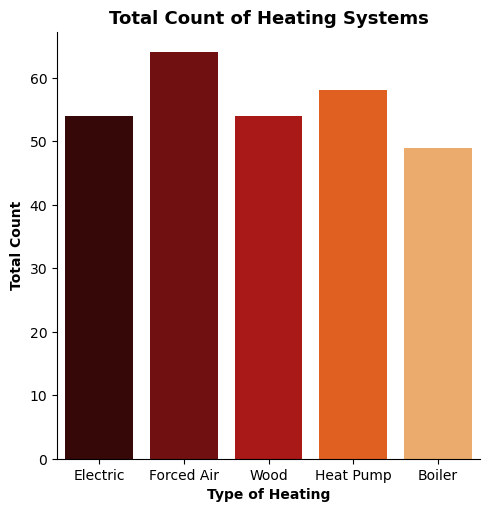

In [29]:
# import seaborn package
import seaborn as sns 

##catplot is specific for categorical data - which make it easier to present information for this type of data
# im calling to use the variables "Heat" and "Count". the data is from "heatdf".The type of graph, which i chose bar, also i included a color palette to be 'gist_heat'
sns.catplot('Heat','Count',data= heatdf, kind='bar', legend=False, palette='gist_heat')

# I labeled the y variable "Total Count", with a font size 10 and bolded it
plt.ylabel('Total Count',fontsize=10, fontweight='bold')
# I labeled the x variables "Type of Heating", with a font size 10 and bolded it
plt.xlabel('Type of Heating',fontsize=10, fontweight='bold')
# I titled the graph "Total Count of Heating Systems", I centered the title and made the font size to be 13 and bolded it
plt.title("Total Count of Heating Systems",loc='center', fontsize=13, fontweight='bold')

#save figure
plt.savefig('finalbarcountheating.png', dpi = 300, transparent=True)
# printed the graph
plt.show()


### Graph 1 Interpretation:
- Graph 1 represents the sum of the different types of heating systems in NYS. The most frequent heating type found in residential properties in NYS is forced air. According to the data set, there were over 60 properties that have forced air heating systems. The least frequent type of heating system found are boilers, there were less than 50 properties that had this type of heating. This graph is important because it helps people understand the data better by providing a clear visual representation of the count in the types of heating. Furthermore, it can help compare the sum of properties with different heating types on a graph, as well as identify any significant differences between the groups. This is useful in identifying any patterns or trends for my research question. 

### Graph #2: Histogram of Total Bedrooms

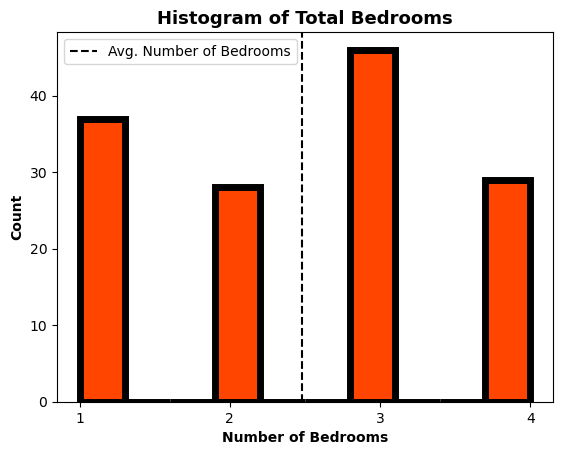

<Figure size 400x400 with 0 Axes>

In [30]:
fig, ax = plt.subplots() 
# I created a historgram by calling for the function "hist" from the 
#"matplotlib" package, I chose the varibale "RoomsTotal" from the dataset 
#"ny_res", with the size of the bars to be 10, I also added a outline border for the histagram , with a linewidth of 5 and colored it orange red

plt.hist(nys_res_data['BedroomsTotal'], bins=10, edgecolor='black', linewidth=5, color ='orangered')
# I labeled the x variable to be the Number of Rooms with font size to be 10 and bolded
plt.xlabel('Number of Bedrooms', fontsize=10, fontweight='bold')
# I labeled the y variable to be the Count in Thousands with font size to be 10 and bolded
plt.ylabel('Count', fontsize=10, fontweight='bold')
# I added a title to be named, "Histagram of Total BedRooms", font size to be 13 adn bolded
plt.title("Histogram of Total Bedrooms",loc='center', fontsize=13, fontweight='bold')



#set the range of my x axis ticks to be from 1-4 (as a way to clean my graph)
plt.xticks(np.arange(1, 5, 1))
#fig size to be 4 by 4
plt.figure(figsize=(4, 4))

#adding a average line for mean number of bedrooms
#defineing the mean of the bedrooms variables
avg = nys_res_data["BedroomsTotal"].mean()
# axvline: axis vertical line
#color back, dashed line, and labeled the dashed line as "Avg. Number of Bedrooms", including legend for it
ax.axvline(avg, color="black", ls="--", label="Avg. Number of Bedrooms")
ax.legend();

#save figure
plt.savefig('finalhistogrambedrooms.png', dpi = 300, transparent=True)
# I printed the histogram
plt.show()

In [31]:
#checking to see what the mean is for the variable bedroom
avg = nys_res_data["BedroomsTotal"].mean()
print(avg)

2.4785714285714286


### Graph 2 Interpretation:
- Graph 2 shows a histogram of the count/sum of specific number of bedrooms the properties have. According to my dataset, most of the residential properties in NY had three rooms. The least frequent were properties that had 2 and 4 rooms. In addition, according to this dataset, the most bedrooms the properties have are 4 bedrooms. This graph was interesting to me because its important to see the range of the number of rooms in the properties and how many properties fall into each category. This can lead to further analysis and bring further question on if there are more bedrooms in the property, does that impact what type of heating is more preferred for that property. In addition, the average number of bedrooms found in residential properties are about 2.5 bedrooms. 

### Graph #3: Scatterplot of Squarefoot and Price

In [32]:
# I created a new dataframe called "sqft_price_ny_res", i filered the new dataset to only have the variables: LotSizeSquareFeet and OriginalListPrice
# I grouped it by LotSizeSquareFeet, i summed it
sqft_price_ny_res = nys_res_data[['LotSizeSquareFeet','OriginalListPrice']].groupby('LotSizeSquareFeet').sum().reset_index()
# i printed the new data
sqft_price_ny_res

,LotSizeSquareFeet,OriginalListPrice
0,502,926866
1,509,295024
2,517,857851
3,520,1017550
4,524,121597
...,...,...
126,1960,293616
127,1983,884930
128,1988,338957
129,1990,473276


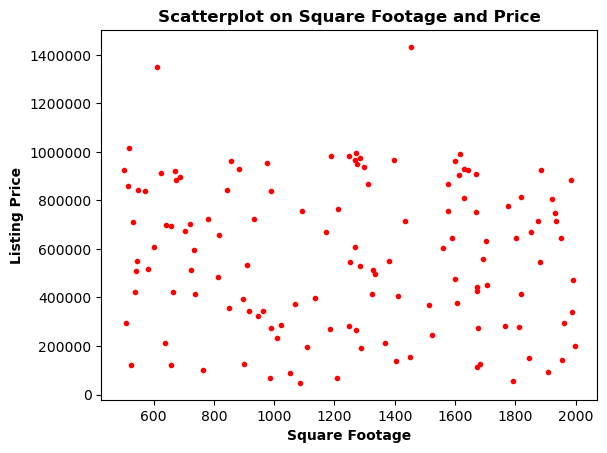

In [33]:
# I created a scatterplot by calling for the function "plot" from the "matplotlib" package, I chose my interest varibales as the "LotSizeSquareFeet" and "OriginalListPrice" from the data set "sqft_price_ny_res"
# the linestyle is none and i chose the marker to be an "*"
#notice that this is the same command as the line graph, but I replace linestyle with none and create a marker type
plt.plot('LotSizeSquareFeet','OriginalListPrice', data=sqft_price_ny_res, linestyle='none', marker='.', color='r')
# I labeled y variable to be the "Listing Price", with font size 10 and bolded it
plt.ylabel('Listing Price',fontsize=10, fontweight='bold')
# I labeled x variable to be the "Square Footage", i made the font size 10 and bolded it
plt.xlabel('Square Footage',fontsize=10, fontweight='bold')
# I titled the plot, bolded it  
plt.title("Scatterplot on Square Footage and Price",fontweight='bold')

plt.ticklabel_format(style='plain') # to prevent scientific notation

#save figure
plt.savefig('finalscattersqftprice.png', dpi = 300, transparent=True)
# print the scatterplot
plt.show()

### Graph 3 Interpretation:
- Graph 3 represents that there is no relationship/correlation between Squarefootage and the value of the residential property. However, the value of a property is influenced by multiple factors, including location, property condition, amenities, and market demand. There may be situations where the relationship between square footage and property value is weaker or less pronounced in certain areas or property types. This could occur due to factors such as zoning regulations that limit the size of properties in certain areas, the availability of land or the cost of construction, or market factors such as high demand for smaller homes or specific locations. In addition, since the data is focused on NYS there may be bias due to the comparison of location in NYS, for example NYC properties vs. upstate properties. A small square footage residential property in Manhattan is more expensive and smaller than a residential property somewhere north in NYS. 

<Figure size 640x480 with 0 Axes>

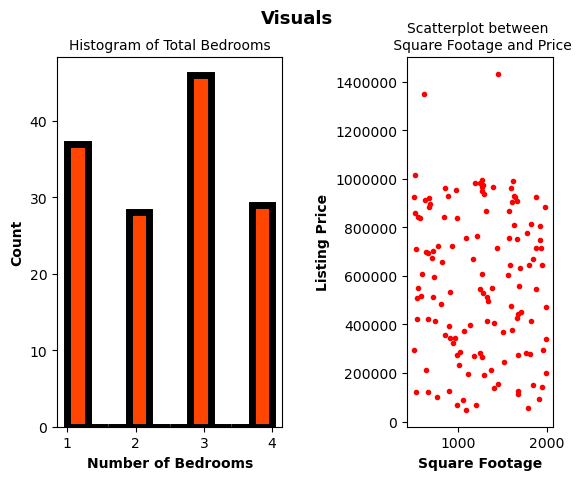

<Figure size 500x500 with 0 Axes>

In [34]:
# created an empty figure here (where it would store the visuals)
fig  = plt.figure()

# creating a space with 1 rows and 2 columns, this helps me save the entire figure in one document
fig, ax = plt.subplots(nrows = 1, ncols = 3)
# I added the title for the figure, with font size 13 and bolded it 
fig.suptitle('Visuals', fontsize=13 ,fontweight='bold') 

# repeat of previous question of hisagram!
ax1 = plt.subplot(1, 2,1)
ax1.hist(nys_res_data['BedroomsTotal'], bins=10, edgecolor='black', linewidth=5, color ='orangered')
# I labeled the x variable to be the Number of Rooms with font size to be 10 and bolded
plt.xlabel('Number of Bedrooms', fontsize=10, fontweight='bold')
# I labeled the y variable to be the Count in Thousands with font size to be 10 and bolded
plt.ylabel('Count', fontsize=10, fontweight='bold')
# I added a title to be named, "Histagram of Total BedRooms", font size to be 13 adn bolded
plt.title("Histagram of Total Bedrooms",loc='center', fontsize=13, fontweight='bold')
# I printed the histogram


# the figure has 1 row, 2 columns, and this plot is the second plot.
ax2 = plt.subplot(1, 3,3)
# assigning index 2 graph to be the scatterplot, the one previously used,
#repeat of code from before on scatterplot
ax2.plot('LotSizeSquareFeet','OriginalListPrice', data=sqft_price_ny_res, linestyle='none', marker='.', color='r')
# I labeled y variable to be the "Listing Price", with font size 10 and bolded it
plt.ylabel('Listing Price',fontsize=10, fontweight='bold')
# I labeled x variable to be the "Square Footage", i made the font size 10 and bolded it
plt.xlabel('Square Footage',fontsize=10, fontweight='bold')
# I titled the plot, bolded it  
plt.title("Scatterplot on Square Footage and Price",fontweight='bold')
plt.ticklabel_format(style='plain') # to prevent scientific notation


ax1.set_title('Histogram of Total Bedrooms',fontsize=10) # Title for subfigure 1, "\n" creates a new line for text- I referenced: https://www.python-graph-gallery.com/190-custom-matplotlib-title  
ax2.set_title('Scatterplot between \n Square Footage and Price',fontsize=10) #<- Title for subfigure 2, "\n" creates a new line for text 

plt.figure(figsize=(5, 5))
# show the figure
plt.show()

## Model
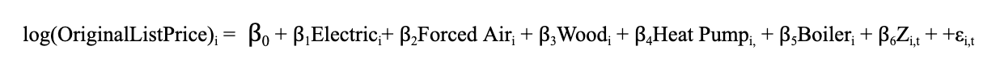


## Final Regression Results 
- __On average, if a property has an electric as a type of heating, there is an increase of 16.3% in the price of the property, holding all else constant.__
- __On average, if a property has a forced air as a type of heating, there is an increase of 21.8% in the price of the property, holding all else constant.__ 
- __On average, if a property has a wood as a type of heating, there is an decrease of 9% in the price of the property, holding all else constant.__
- __On average, if a property has a heat pump as a type of heating, there is an decrease of 4% in the price of the property, holding all else constant.__
- __On average, if a property has a boiler as a type of heating, there is an decrease of 23% in the price of the property, holding all else constant.__
- For every additional day the residential property is on the market, there is a decrease of 0.1% on the property, on average, holding all else of the variables constant. 
- On average, for every one square foot increase, there is a decrease of 0.1% in the price on the property, holding all else equal.
- For a property with 1000 square feet, there is a decrease of 0.1% in the price on the property holding all else constant.
- For every additional bedroom in the residential property, there is a decrease of 9.4% in the price on the property on average, holding all else constant.
- On average if the residential property has a pool, there is a decrease of 5% in the price on the property, holding all else constant.
- On average if the residential property has a garage, there is a increase of 13.8% in the price on the property, holding all else constant.
- For every additional story in the residential property, there is a increase of 3.5% in the price on the property, holding all else constant.
- For every additional year of the property since it was built, there is an increase of 0.02% in the price on the property, holding all else constant.
- For one percentage change in annual tax, there is a decrease of 0.17% in the price on the property, holding all the other variables constant.

## Discussion
- Holding all the variables constant, regression 1,2, and 3 show that forced air heating system has the highest average effect in increasing value of a residential property.
- Regression 3, shows that on average, if a property has a boiler as a type of heating, there is a decrease of 23% in the price of the property. In addition, it was statistically significant at the 90% confidence level. Also, for every additional day the residential property is on the market, there is a decrease of 0.1% on the property, on average, holding all else of the variables constant with a 95% confidence level.
- Regression 3 shows that the age of the property has no significant effect on value of the property about an increase of 0.02%, holding all else constant. 
- As mentioned above, the interest variables in regression 3 shows that: 
    - On average, if a property has an electric as a type of heating, there is an increase of 16.3% in the price of the property, holding all else constant.
    - On average, if a property has a forced air as a type of heating, there is an increase of 21.8% in the price of the property, holding all else constant.
    - On average, if a property has a wood as a type of heating, there is a decrease of 9% in the price of the property, holding all else constant.
    - On average, if a property has a heat pump as a type of heating, there is a decrease of 4% in the price of the property, holding all else constant.
    - On average, if a property has a boiler as a type of heating, there is a decrease of 23% in the price of the property, holding all else constant.


### Future Research
- I would focus on a specific location in NYS, such as NYC residential properties or a specific county in the state to get more accurate results and limit bias. In addition, I would increase the sample size and diversity of the properties studied. This can help to ensure that the findings are more representative of the overall population of residential properties, and can provide more accurate insights into the effects of different heating systems. Also, to possibly control for other factors that may influence property value, such as location, size, condition of the property. This can help to isolate the effects of the heating system and provide more reliable results.

### Significance
- The data and the variables were found to be not statiscally significant at any of the 3 significant levels. There was no statistical significant relationship or effect on the outcome of price.
- A few reasons why this explains why the data is showing those results and is not significant:
1. The sample size: the sample size might be too small for this type of research.
2. Poor data collection: Data has errors, perhaps outliers, and suffers from measurement biases. This produces not statistically significant results and misleading conclusions.
3. Sampling/Selection and Presentation Bias: this data might have suffered from this, the data used for analysis was not randomly or representatively sampled.
4. Confounding variables: other controlling factors are not taken into consideration, or factors that have an impact on both the price and the independent variables, might have been the reason for the findings without statistical significance. Results from the analysis were inaccurate and inconclusive due to this.

## Conclusion

- The type of heating system in a house can affect its value based on factors such as efficiency, maintenance and repair costs, and safety risks. 
1.  Electric heating systems and forced air systems are known for their energy efficiency, which can save homeowners money on utility bills over time. Electric heating systems convert all the electricity they consume into heat, which means they waste less energy than other types of heating systems. Forced air systems can also be efficient if they are properly installed and maintained. Therefore, there is an increase in price value of the property with electric and forced air heating types.
2. Wood-burning stoves and fireplaces require regular maintenance to operate safely and efficiently. If not properly maintained, they can pose a fire hazard and affect indoor air quality. While boilers are known for their efficiency and long lifespan, they can require more maintenance and repairs than other types of heating systems. Additionally, if a home's boiler is outdated or in need of repair, it could be a turnoff for potential buyers. Boilers can also require a separate fuel source such as oil or gas, which can add to the cost of homeownership. Also, the units can grow quite hot to the touch and can be dangerous around small children, which casues a safety risk. Lastly, in colder climates, such as for New York State, heat pumps may not be able to provide enough heat during extremely cold temperatures. Homes with heat pumps may also require additional insulation or other modifications to ensure adequate heating and cooling, which can add to the overall cost of homeownership. Therefore, there was a negative effect in price value of the properties.
- Overall, the study found that properties with more efficient and effective heating systems tend to have higher prices and values than those with older or less efficient systems. Specifically, the study found that properties with forced-air heating, electric tended to have higher prices and values than those with wood heating, heat pump or other less efficient systems. 


<img src ="https://media.giphy.com/media/DfbpTbQ9TvSX6/giphy.gif">
